[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/MeyerBender/spatialproteomics_workshop/blob/main/notebooks/workshop02_solution.ipynb)

# Downstream analysis of spatial proteomics data

In the previous exercise, you have seen which steps are required to transform high-dimensional image data into something more workable, such as a list of cells with associated cell types.
This is the prerequisite for any meaningful downstream analysis, the goal of which it is to find spatial patterns associated with a readout of interest, such as patient survival.
Here, we explore how one can go from individual cell types to constructing neighborhood profiles.

In [1]:
# download the data
# if you have already run this cell once, there is no need to run it again

# use this when running on colab
! wget https://www.huber.embl.de/users/matthias/spatialproteomics_workshop_data.tar.gz /content/spatialproteomics_workshop_data.tar.gz
! tar -xzf /content/spatialproteomics_workshop_data.tar.gz
! pip install --quiet spatialproteomics==0.6.7 squidpy==1.2.2
data_dir = '/content/data'

# use this when running locally
# ! wget https://www.huber.embl.de/users/matthias/spatialproteomics_workshop_data.tar.gz spatialproteomics_workshop_data.tar.gz
# ! tar -xzf spatialproteomics_workshop_data.tar.gz
# data_dir = 'data'

--2024-11-26 09:44:48--  https://www.huber.embl.de/users/matthias/spatialproteomics_workshop_data.tar.gz
Resolving www.huber.embl.de (www.huber.embl.de)... 192.168.210.19
Connecting to www.huber.embl.de (www.huber.embl.de)|192.168.210.19|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 210111568 (200M) [application/gzip]
Saving to: ‘spatialproteomics_workshop_data.tar.gz.2’

spatialproteomics_w 100%[===================>] 200.38M   111MB/s    in 1.8s    

2024-11-26 09:44:50 (111 MB/s) - ‘spatialproteomics_workshop_data.tar.gz.2’ saved [210111568/210111568]

--2024-11-26 09:44:50--  http://spatialproteomics_workshop_data.tar.gz/
Resolving spatialproteomics_workshop_data.tar.gz (spatialproteomics_workshop_data.tar.gz)... failed: nodename nor servname provided, or not known.
wget: unable to resolve host address ‘spatialproteomics_workshop_data.tar.gz’
FINISHED --2024-11-26 09:44:50--
Total wall clock time: 1.9s
Downloaded: 1 files, 200M in 1.8s (111 MB/s)


In [2]:
%reload_ext autoreload
%autoreload 2

import xarray as xr
import spatialproteomics as sp
import matplotlib.pyplot as plt
import scanpy as sc
from tqdm.auto import tqdm
from glob import glob
import seaborn as sns
import os
import pandas as pd

## Reading in files
Let's look at some lymph nodes. Segmentation and cell type prediction was already performed on this data, so we can simply read in the zarr files.

In [3]:
channels = ['PAX5', 'CD3', 'CD11b', 'CD11c', 'CD15', 'CD68', 'Podoplanin', 'CD31', 'CD34', 'CD90', 'CD56']
quantiles = [0.8, 0.5, 0.8, 0.8, 0.8, 0.8, 0.95, 0.95, 0.95, 0.95, 0.8]
colors = ['#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#ffd8b1', '#f58231', '#911eb4', '#fffac8', '#469990', '#fabed4', '#9A6324']
ct_marker_dict = {'B': 'PAX5', 'T': 'CD3', 'Myeloid': 'CD11b', 'Dendritic': 'CD11c', 'Granulo': 'CD15', 'Macro': 'CD68', 'Stroma PDPN': 'Podoplanin', 'Stroma CD31': 'CD31', 'Stroma CD34': 'CD34', 'Stroma CD90': 'CD90', 'NK': 'CD56'}

In [4]:
sp_dict = {}
for sample_path in glob(os.path.join(data_dir, 'zarrs/*.zarr')):
    sample_id = sample_path.split('/')[-1].replace(".zarr", "")
    sp_dict[sample_id] = xr.open_dataset(sample_path, engine='zarr')

In [5]:
sp_dict['166_1_I2_LK']

<xarray.Dataset>
Dimensions:         (channels: 11, y: 3000, x: 3000, cells: 19581, labels: 11,
                     la_props: 2, features: 3)
Coordinates:
  * cells           (cells) int64 1 2 3 4 5 6 ... 19577 19578 19579 19580 19581
  * channels        (channels) <U11 'PAX5' 'CD3' 'CD11b' ... 'CD90' 'CD56'
  * features        (features) <U10 '_labels' 'centroid-0' 'centroid-1'
  * la_props        (la_props) <U6 '_color' '_name'
  * labels          (labels) int64 1 2 3 4 5 6 7 8 9 10 11
  * x               (x) int64 0 1 2 3 4 5 6 ... 2994 2995 2996 2997 2998 2999
  * y               (y) int64 0 1 2 3 4 5 6 ... 2994 2995 2996 2997 2998 2999
Data variables:
    _image          (channels, y, x) float64 ...
    _intensity      (cells, channels) float64 ...
    _la_properties  (labels, la_props) object ...
    _obs            (cells, features) float64 ...
    _segmentation   (y, x) int64 ...

  0%|          | 0/4 [00:00<?, ?it/s]

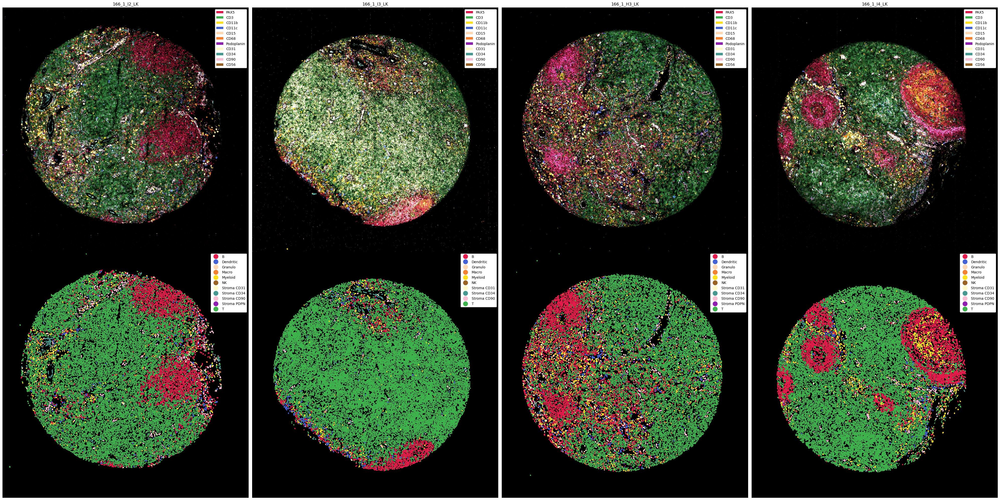

In [6]:
fig, ax = plt.subplots(2, 4, figsize=(40, 20))
ax = ax.flatten()

for i, sample_id in enumerate(tqdm(sp_dict.keys())):
    sp_obj = sp_dict[sample_id]
    sp_obj.pp.downsample(4).pl.colorize(colors).pl.show(ax=ax[i])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(sample_id)
    
    # plotting the ct preds
    sp_obj.pl.show(render_image=False, render_labels=True, ax=ax[i+4])
    ax[i+4].set_xticks([])
    ax[i+4].set_yticks([])
    
plt.tight_layout()

## Exploration of marker profiles
Before we do any neighborhood analysis, let's verify that our cell type annotations are somewhat sensible. We can for example do this by plotting the expression matrix or UMAP of every sample. There are many ways to do this, however `scanpy` has become one of the most useful frameworks for this purpose. `Spatialproteomics` provides export functions to interact with other packages. Let's convert our `spatialproteomics` objects into `anndata` objects and use `scanpy` for a preliminary analysis.

In [7]:
adata_dict = {}
for sample_id, sp_obj in tqdm(sp_dict.items()):
    # converting to anndata and performing umap computation
    adata = sp_obj.tl.convert_to_anndata()
    sc.pp.neighbors(adata)  # Compute neighbors
    sc.tl.umap(adata)       # Compute UMAP
    adata_dict[sample_id] = adata

  0%|          | 0/4 [00:00<?, ?it/s]

... storing '_labels' as categorical


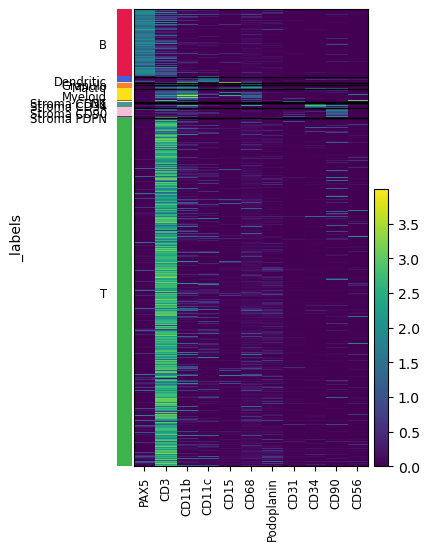

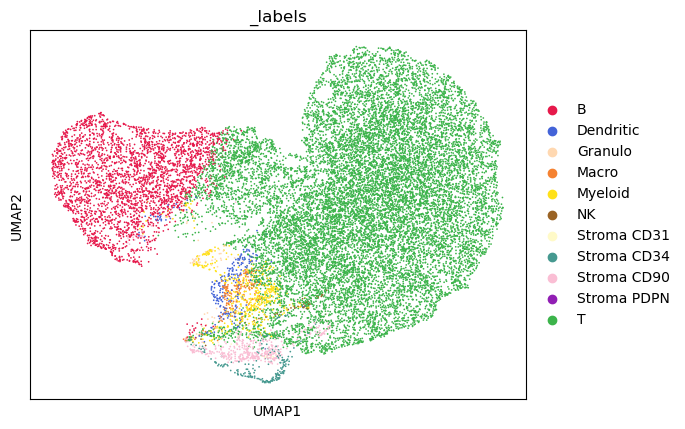

... storing '_labels' as categorical


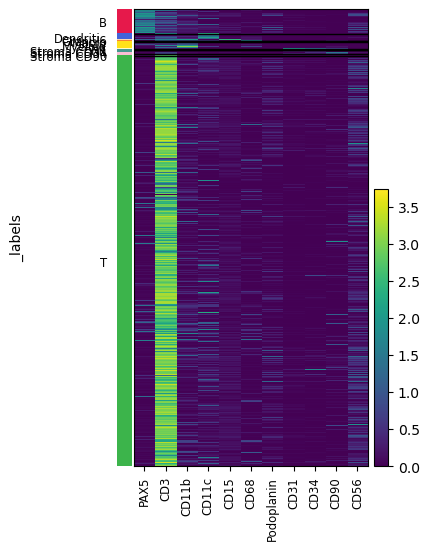

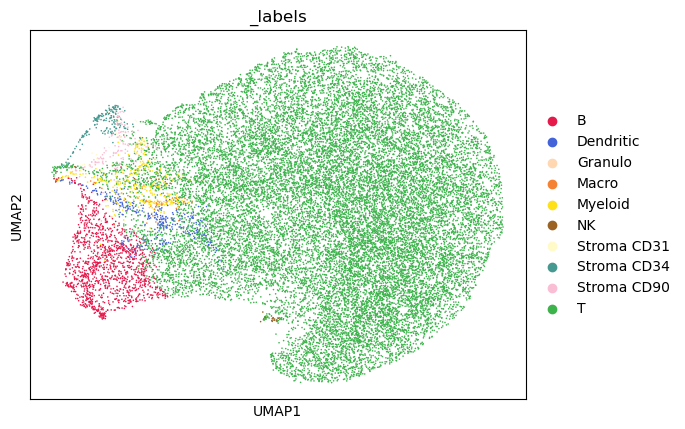

... storing '_labels' as categorical


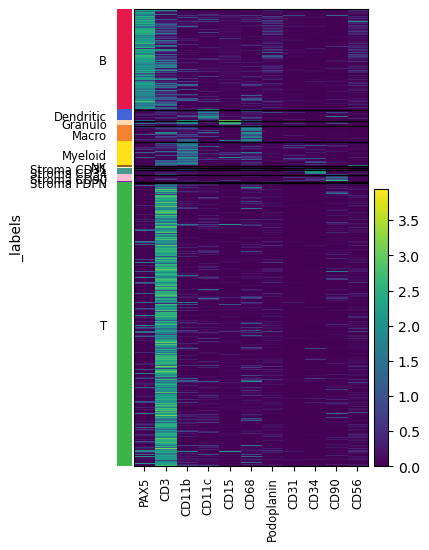

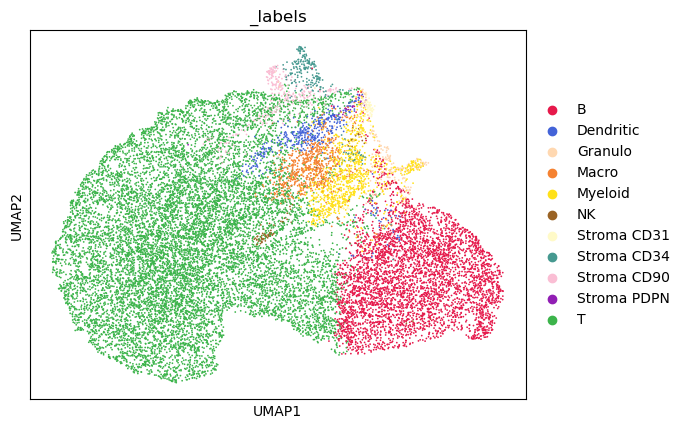

... storing '_labels' as categorical


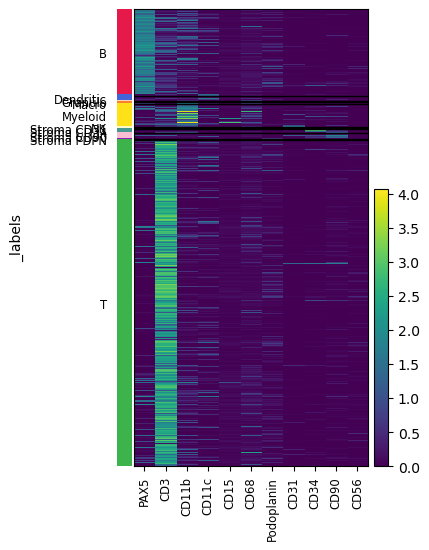

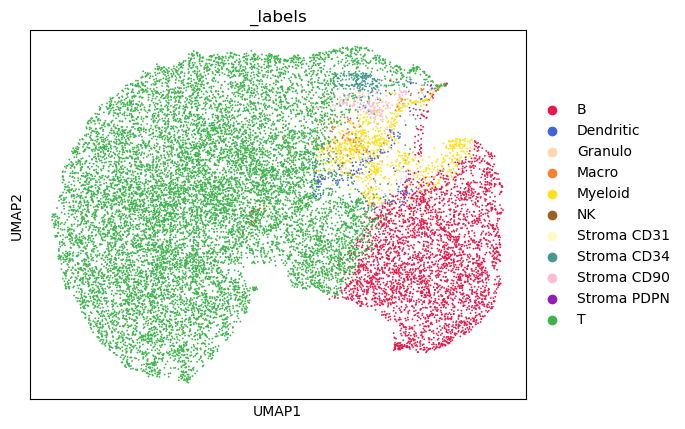

In [8]:
for sample_id, adata in adata_dict.items():
    sc.pl.heatmap(adata, var_names=adata.var_names, groupby='_labels')
    sc.pl.umap(adata, color='_labels')

## Defining neighborhoods
Next up, we can define cellular neighborhoods. This boils down to two steps. 

In the first step, we count all cells within a specified radius of a cell. For example, if we look at cell A, we count all cells in a radius of 50 microns, and note down their relative frequencies. So instead of saying that a cell is a B cell, we can now say that it is in a neighborhood with 80% B cells and 20% T cells.

Once we have those neighborhood profiles, we can cluster them across all samples. There are many ways to do this, but in order to keep things simple, we only look at k-mean clustering here.

In [9]:
# this line packages the dictionary into an ImageContainer, which provides some useful functions to compute neighborhoods across samples
image_container = sp.ImageContainer(sp_dict)
# this method returns a dict in the same format as we provided as input
sp_dict = image_container.compute_neighborhoods()
# obtaining a data frame containing the neighborhood compositions
nh_composition = image_container.get_neighborhood_composition()

In [10]:
nh_composition

,B,Dendritic,Granulo,Macro,Myeloid,NK,Stroma CD31,Stroma CD34,Stroma CD90,Stroma PDPN,T
neighborhood,,,,,,,,,,,
Neighborhood 0,-1.096716,-1.233873,-0.855335,-1.085713,-1.433812,-1.003443,-0.881494,-1.132572,-1.077127,-1.159201,1.402430
Neighborhood 1,-0.262562,1.138428,-0.101124,0.660890,0.764643,0.892959,0.466273,1.378335,0.912578,0.943848,-0.002166
Neighborhood 2,1.686397,-0.925409,-0.620025,-1.052340,-0.618266,-1.218884,-1.200421,-1.143041,-1.291183,-1.143516,-1.306188
Neighborhood 3,-0.808090,-0.123640,-0.358731,-0.031492,-0.114078,0.021864,0.014285,0.215859,0.353520,1.196404,0.766176
Neighborhood 4,0.480971,1.144495,1.935215,1.508655,1.401513,1.307505,1.601357,0.681419,1.102211,0.162465,-0.860252


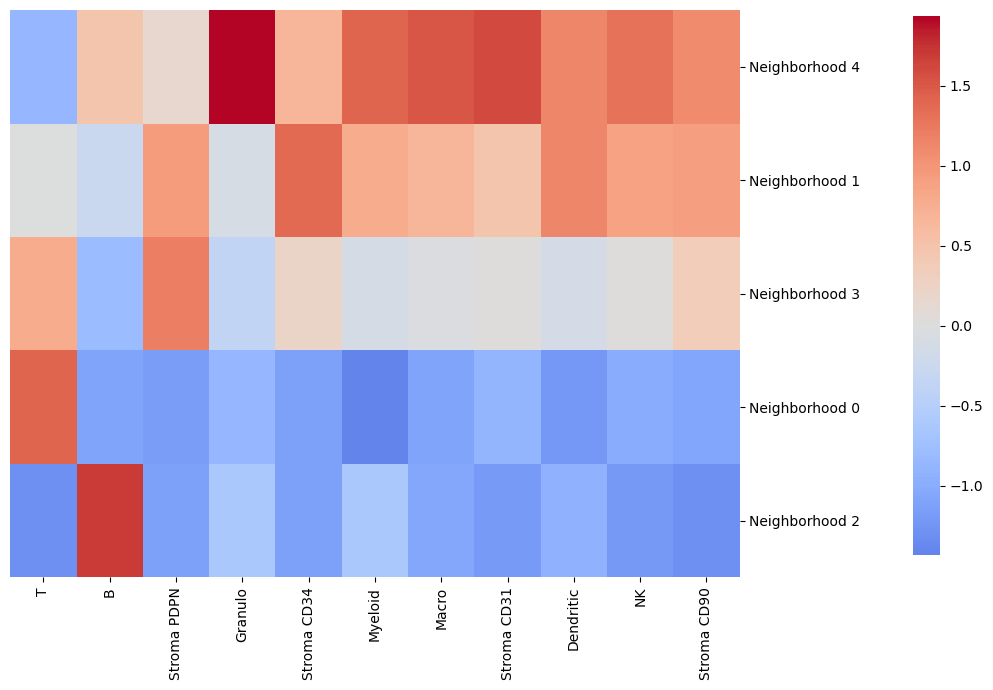

In [21]:
# plotting the neighborhood composition as a seaborn clustermap
cluster_map = sns.clustermap(
    nh_composition,
    cmap='coolwarm',
    cbar_pos=(1.02, 0.2, 0.03, 0.77),  # Position the colorbar to the right of the heatmap
    dendrogram_ratio=(0.00001, 0),  # Remove row dendrogram
    figsize=(9, 7),  # Adjust the size
    annot=False,  # No annotation
    center=0  # Set the center of the colorbar to 0
)

# customizations of the plot
cluster_map.ax_heatmap.set_ylabel('')
plt.show()

In [12]:
# setting colors of the neighborhoods to be closer to the colors we used for the corresponding cell types
nh_colors = {'Neighborhood 0': '#3cb44b', 'Neighborhood 1': '#469990', 'Neighborhood 2': '#e6194B', 'Neighborhood 3': '#911eb4', 'Neighborhood 4': '#ffd8b1'}

for sample_id, sp_obj in sp_dict.items():
    sp_dict[sample_id] = sp_obj.nh.set_neighborhood_colors(nh_colors.keys(), nh_colors.values())

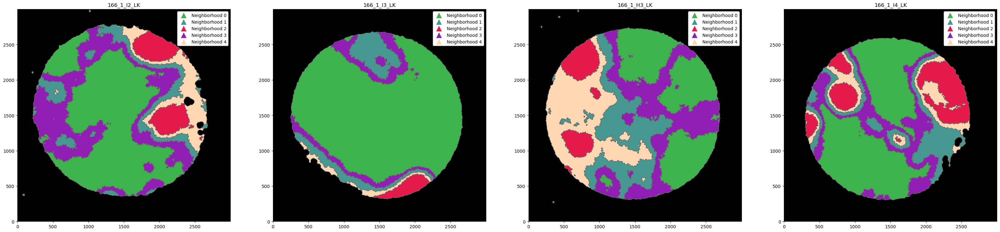

In [13]:
fig, ax = plt.subplots(1, 4, figsize=(40, 10))
ax = ax.flatten()

for i, (sample_id, sp_obj) in enumerate(sp_dict.items()):
    sp_obj.pl.show(render_image=False, render_neighborhoods=True, ax=ax[i])
    ax[i].set_title(sample_id)

  0%|          | 0/4 [00:00<?, ?it/s]

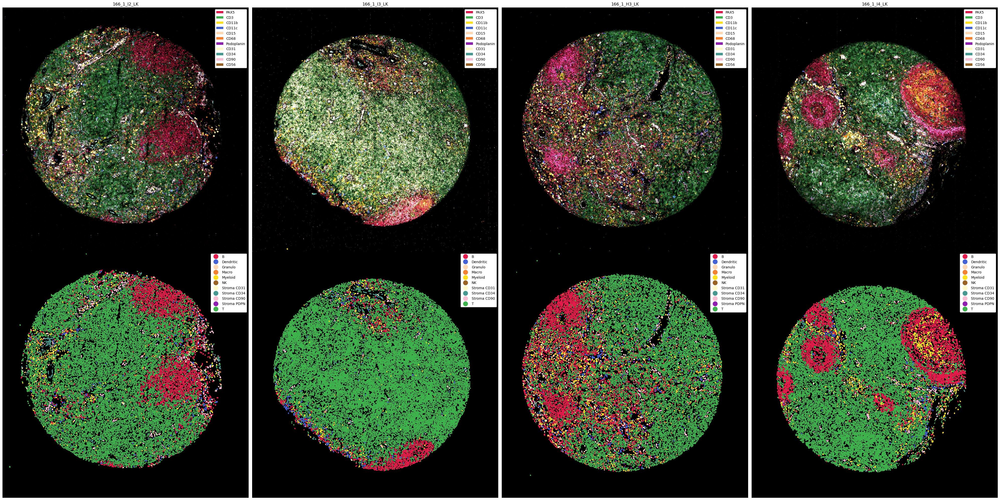

In [14]:
# plotting the original labels again
fig, ax = plt.subplots(2, 4, figsize=(40, 20))
ax = ax.flatten()

for i, sample_id in enumerate(tqdm(sp_dict.keys())):
    sp_obj = sp_dict[sample_id]
    sp_obj.pp.downsample(4).pl.colorize(colors).pl.show(ax=ax[i])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(sample_id)
    
    # plotting the ct preds
    sp_obj.pl.show(render_image=False, render_labels=True, ax=ax[i+4])
    ax[i+4].set_xticks([])
    ax[i+4].set_yticks([])
    
plt.tight_layout()

In [15]:
# getting the neighborhood composition and label for each individual cell
neighborhood_composition_per_cell = []
neighborhood_label_per_cell = []

for sp_obj in sp_dict.values():
    # this df contains the neighborhood composition around each cell
    neighborhood_composition_per_cell.append(sp_obj.pp.get_layer_as_df('_neighborhoods'))
    # this line obtains the neighborhood label of each 
    neighborhood_label_per_cell.append(sp_obj.pp.get_layer_as_df()['_neighborhoods'])

neighborhood_composition_per_cell = pd.concat(neighborhood_composition_per_cell, axis=0).reset_index(drop=True).fillna(0)
neighborhood_label_per_cell = pd.concat(neighborhood_label_per_cell, axis=0).reset_index(drop=True)

In [16]:
neighborhood_composition_per_cell.head()

,B,Dendritic,Granulo,Macro,Myeloid,NK,Stroma CD31,Stroma CD34,Stroma CD90,Stroma PDPN,T
0,0.177215,0.000000,0.012658,0.0,0.000000,0.0,0.0,0.000000,0.012658,0.0,0.797468
1,0.066667,0.016667,0.016667,0.0,0.016667,0.0,0.0,0.000000,0.000000,0.0,0.883333
2,0.064935,0.012987,0.000000,0.0,0.012987,0.0,0.0,0.000000,0.012987,0.0,0.896104
3,0.219512,0.000000,0.012195,0.0,0.000000,0.0,0.0,0.036585,0.012195,0.0,0.719512
4,0.120482,0.012048,0.012048,0.0,0.000000,0.0,0.0,0.000000,0.012048,0.0,0.843373


In [17]:
neighborhood_label_per_cell.head()

0    Neighborhood 3
1    Neighborhood 0
2    Neighborhood 0
3    Neighborhood 3
4    Neighborhood 3
Name: _neighborhoods, dtype: object

            PC1       PC2          labels
0      0.706287  0.489672  Neighborhood 3
1      0.656960  0.015491  Neighborhood 0
2      1.139772  0.093980  Neighborhood 0
3      0.131096  0.309951  Neighborhood 3
4      0.747093  0.239108  Neighborhood 3
...         ...       ...             ...
79681  1.689376 -0.149603  Neighborhood 0
79682  1.689376 -0.149603  Neighborhood 0
79683  1.689376 -0.149603  Neighborhood 0
79684  1.689376 -0.149603  Neighborhood 0
79685  1.689376 -0.149603  Neighborhood 0

[79686 rows x 3 columns]


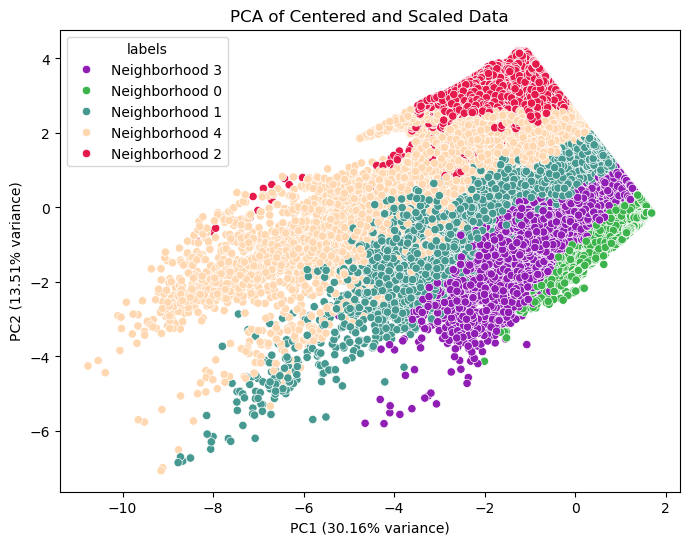

In [18]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Step 1: Center and Scale the DataFrame
scaler = StandardScaler()
scaled_data = scaler.fit_transform(neighborhood_composition_per_cell)

# Step 2: Compute PCA
pca = PCA(n_components=2)  # Reduce to 2 principal components
pca_result = pca.fit_transform(scaled_data)

# Step 3: Convert PCA result to a DataFrame for easier plotting
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# adding the labels
pca_df['labels'] = neighborhood_label_per_cell

print(pca_df)

# Step 4: Plot the PCA Results
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', hue='labels', palette=nh_colors, data=pca_df)
plt.title('PCA of Centered and Scaled Data')
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.show()

## Additional analysis with squidpy
There are plenty of tools to analyse spatial data these days. Let's briefly look at how to use squidpy to create a neighborhood enrichment.

In [19]:
# this is only on a single sample, you could also concatenate the adata objects to get a more global view
import squidpy as sq

adata = adata_dict['166_1_H3_LK']

  0%|          | 0/1000 [00:00<?, ?/s]

/Users/mbender/mambaforge/envs/eccb_env/lib/python3.11/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/mbender/mambaforge/envs/eccb_env/lib/python3.11/site-packages/squidpy/pl/_utils.py:555: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  row_labels = adata.obs[key][row_order]


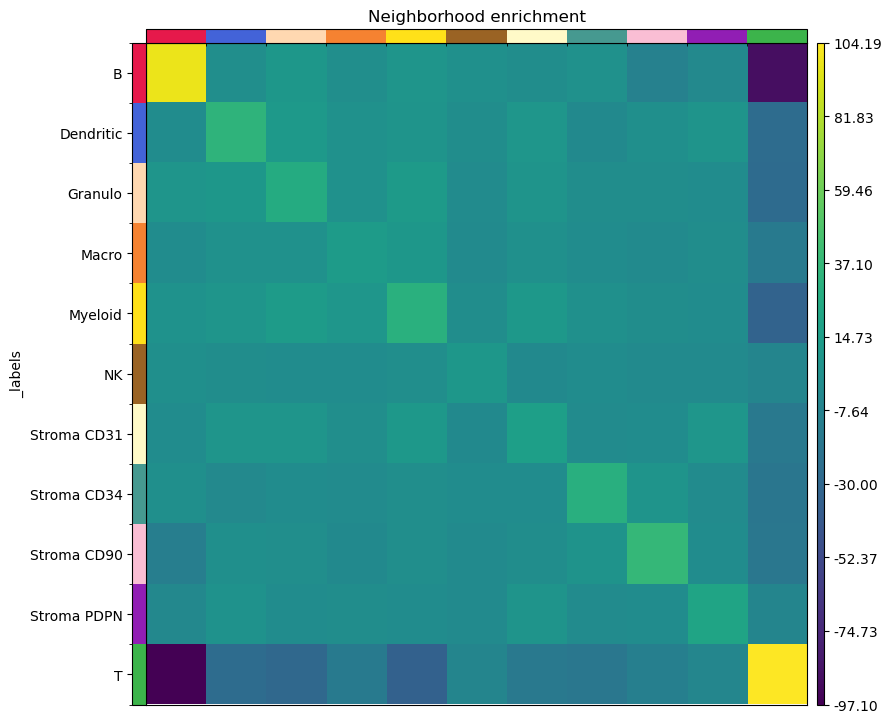

In [20]:
sq.gr.spatial_neighbors(adata)
sq.gr.nhood_enrichment(adata, cluster_key="_labels")
sq.pl.nhood_enrichment(adata, cluster_key="_labels")